In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [46]:
df = pd.read_csv('creditcard.csv')
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0.0
1,0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0.0
2,1,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0.0
3,1,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0.0
4,2,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0.0


In [4]:
df.shape

(11665, 31)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11665 entries, 0 to 11664
Data columns (total 31 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Time    11665 non-null  int64  
 1   V1      11665 non-null  float64
 2   V2      11665 non-null  float64
 3   V3      11665 non-null  float64
 4   V4      11665 non-null  float64
 5   V5      11665 non-null  float64
 6   V6      11665 non-null  float64
 7   V7      11665 non-null  float64
 8   V8      11665 non-null  float64
 9   V9      11665 non-null  float64
 10  V10     11665 non-null  float64
 11  V11     11665 non-null  float64
 12  V12     11664 non-null  float64
 13  V13     11664 non-null  float64
 14  V14     11664 non-null  float64
 15  V15     11664 non-null  float64
 16  V16     11664 non-null  float64
 17  V17     11664 non-null  float64
 18  V18     11664 non-null  float64
 19  V19     11664 non-null  float64
 20  V20     11664 non-null  float64
 21  V21     11664 non-null  float64
 22

In [6]:
df.isnull().sum()

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       1
V13       1
V14       1
V15       1
V16       1
V17       1
V18       1
V19       1
V20       1
V21       1
V22       1
V23       1
V24       1
V25       1
V26       1
V27       1
V28       1
Amount    1
Class     1
dtype: int64

In [7]:
df.tail()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
11660,19915,1.294875,-0.645847,0.689549,-0.351634,-1.026884,-0.129811,-0.928101,0.114172,0.804717,...,-0.097462,-0.020893,0.040297,0.159282,0.350705,-0.278351,-0.010354,-0.008003,10.0,0.0
11661,19915,1.404683,-0.554883,0.612239,-0.234956,-1.190992,-0.816824,-0.775771,-0.142637,1.121638,...,-0.196110,-0.303562,0.005661,0.313352,0.473813,-0.276618,-0.024026,0.002106,5.0,0.0
11662,19915,-0.945541,0.479754,1.521916,-1.298658,-0.852548,-0.604029,-0.354686,0.498106,0.407159,...,-0.050745,0.056031,-0.055584,0.312195,0.026299,-0.413466,0.189152,0.086360,10.0,0.0
11663,19915,-0.087909,0.184093,1.683910,-0.837378,-0.682605,-0.669907,-0.056222,-0.120669,0.409636,...,-0.109428,-0.054760,-0.139329,0.333267,0.072695,-0.320292,0.006423,0.010148,10.0,0.0
11664,19915,1.504229,-0.499337,0.052377,-0.576345,-0.393971,0.015149,-0.718603,-0.125852,1.023281,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
df.iloc[-1]

Time      19915.000000
V1            1.504229
V2           -0.499337
V3            0.052377
V4           -0.576345
V5           -0.393971
V6            0.015149
V7           -0.718603
V8           -0.125852
V9            1.023281
V10           0.141308
V11          -0.993422
V12                NaN
V13                NaN
V14                NaN
V15                NaN
V16                NaN
V17                NaN
V18                NaN
V19                NaN
V20                NaN
V21                NaN
V22                NaN
V23                NaN
V24                NaN
V25                NaN
V26                NaN
V27                NaN
V28                NaN
Amount             NaN
Class              NaN
Name: 11664, dtype: float64

In [9]:
df = df.dropna()
print(df.shape)

(11664, 31)


In [10]:
df.tail()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
11659,19914,1.348167,-0.531813,0.737667,-0.312410,-1.147767,-0.585711,-0.810412,-0.062116,0.705208,...,-0.120215,-0.076450,0.006995,0.489243,0.448523,-0.309831,-0.021411,-0.003987,5.0,0.0
11660,19915,1.294875,-0.645847,0.689549,-0.351634,-1.026884,-0.129811,-0.928101,0.114172,0.804717,...,-0.097462,-0.020893,0.040297,0.159282,0.350705,-0.278351,-0.010354,-0.008003,10.0,0.0
11661,19915,1.404683,-0.554883,0.612239,-0.234956,-1.190992,-0.816824,-0.775771,-0.142637,1.121638,...,-0.196110,-0.303562,0.005661,0.313352,0.473813,-0.276618,-0.024026,0.002106,5.0,0.0
11662,19915,-0.945541,0.479754,1.521916,-1.298658,-0.852548,-0.604029,-0.354686,0.498106,0.407159,...,-0.050745,0.056031,-0.055584,0.312195,0.026299,-0.413466,0.189152,0.086360,10.0,0.0
11663,19915,-0.087909,0.184093,1.683910,-0.837378,-0.682605,-0.669907,-0.056222,-0.120669,0.409636,...,-0.109428,-0.054760,-0.139329,0.333267,0.072695,-0.320292,0.006423,0.010148,10.0,0.0


In [11]:
len(df.Time.unique())

7682

In [12]:
len(df.Amount.unique())

4138

In [14]:
df['Class'].value_counts()

0.0    11615
1.0       49
Name: Class, dtype: int64

In [15]:
col_list = list(df.columns)
col_list

['Time',
 'V1',
 'V2',
 'V3',
 'V4',
 'V5',
 'V6',
 'V7',
 'V8',
 'V9',
 'V10',
 'V11',
 'V12',
 'V13',
 'V14',
 'V15',
 'V16',
 'V17',
 'V18',
 'V19',
 'V20',
 'V21',
 'V22',
 'V23',
 'V24',
 'V25',
 'V26',
 'V27',
 'V28',
 'Amount',
 'Class']

C:\Users\Nandhakumar\AppData\Local\Temp\ipykernel_11176\1125727111.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['Time'])


<Axes: xlabel='Time', ylabel='Density'>

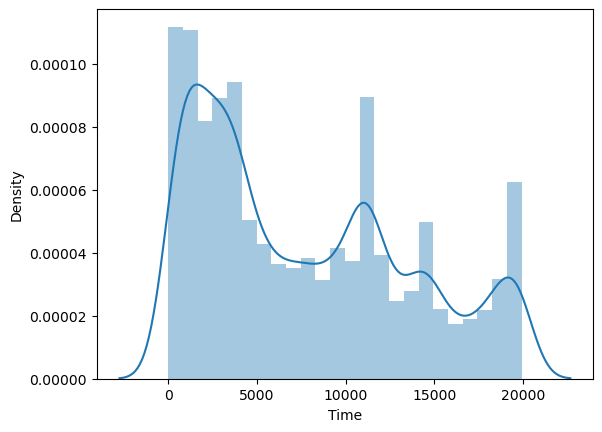

In [17]:
sns.distplot(df['Time'])

<Axes: xlabel='Class', ylabel='Time'>

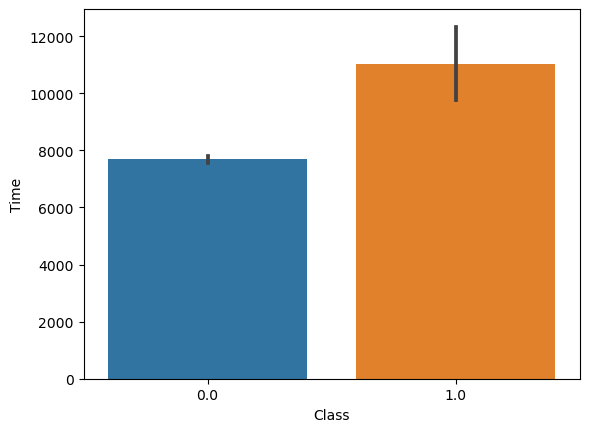

In [19]:
sns.barplot(y='Time', x='Class', data=df)

<Axes: xlabel='Class', ylabel='Time'>

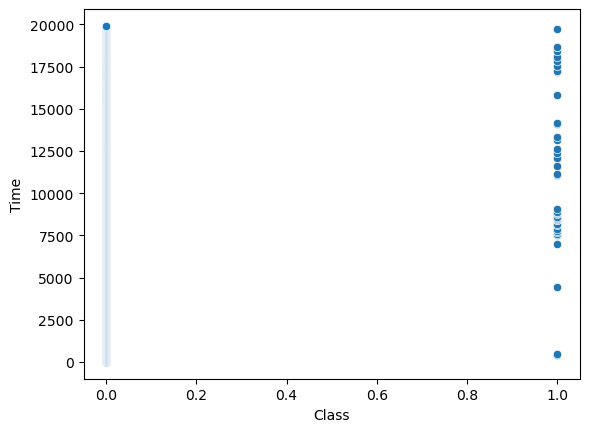

In [23]:
sns.scatterplot(y='Time', x='Class', data=df)

In [20]:
col_lis = ['V1',
 'V2',
 'V3',
 'V4',
 'V5',
 'V6',
 'V7',
 'V8',
 'V9',
 'V10',
 'V11',
 'V12',
 'V13',
 'V14',
 'V15',
 'V16',
 'V17',
 'V18',
 'V19',
 'V20',
 'V21',
 'V22',
 'V23',
 'V24',
 'V25',
 'V26',
 'V27',
 'V28',
 'Amount',
 'Class']

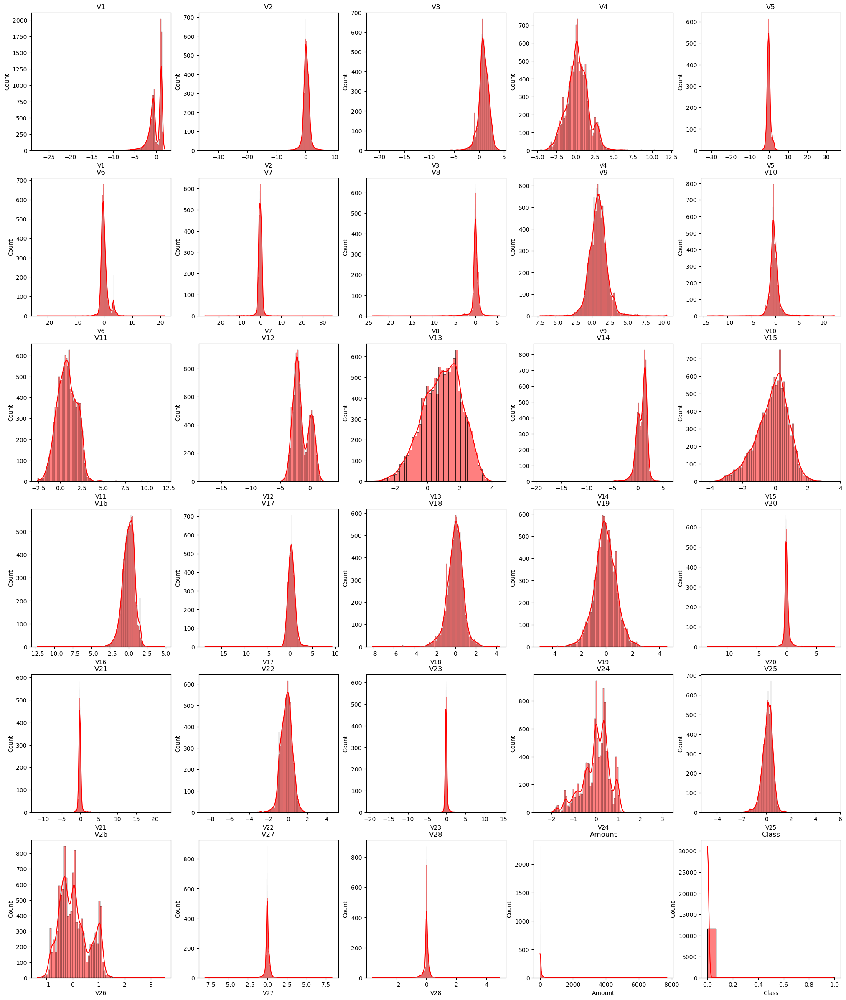

In [22]:
plt.subplots(6,5, figsize = (25,30))
i = 1
for col in col_lis:
    plt.subplot(6,5,i)
    sns.histplot(df[col], color='red', kde=True)
    plt.title(col)
    i += 1

In [24]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Time,11664.0,7700.038923,5964.152936,0.000000,2463.000000,6308.000000,11896.500000,19915.000000
V1,11664.0,-0.219749,1.561107,-27.670569,-0.987263,-0.347859,1.159313,1.960497
V2,11664.0,0.275054,1.305821,-34.607649,-0.256929,0.263103,0.888821,9.067613
V3,11664.0,0.898063,1.272534,-21.405836,0.416376,0.950089,1.616290,4.101716
V4,11664.0,0.281090,1.468011,-4.657545,-0.615559,0.215481,1.153440,11.927512
V5,11664.0,-0.078968,1.184380,-32.092129,-0.680729,-0.179583,0.348249,34.099309
V6,11664.0,0.140066,1.305527,-23.496714,-0.622467,-0.147979,0.509058,21.393069
V7,11664.0,-0.111568,1.129291,-26.548144,-0.583650,-0.088459,0.439539,34.303177
V8,11664.0,-0.051870,1.237045,-23.632502,-0.186433,0.011706,0.267141,5.499963
V9,11664.0,0.893578,1.182180,-7.175097,0.181498,0.880714,1.570372,10.392889


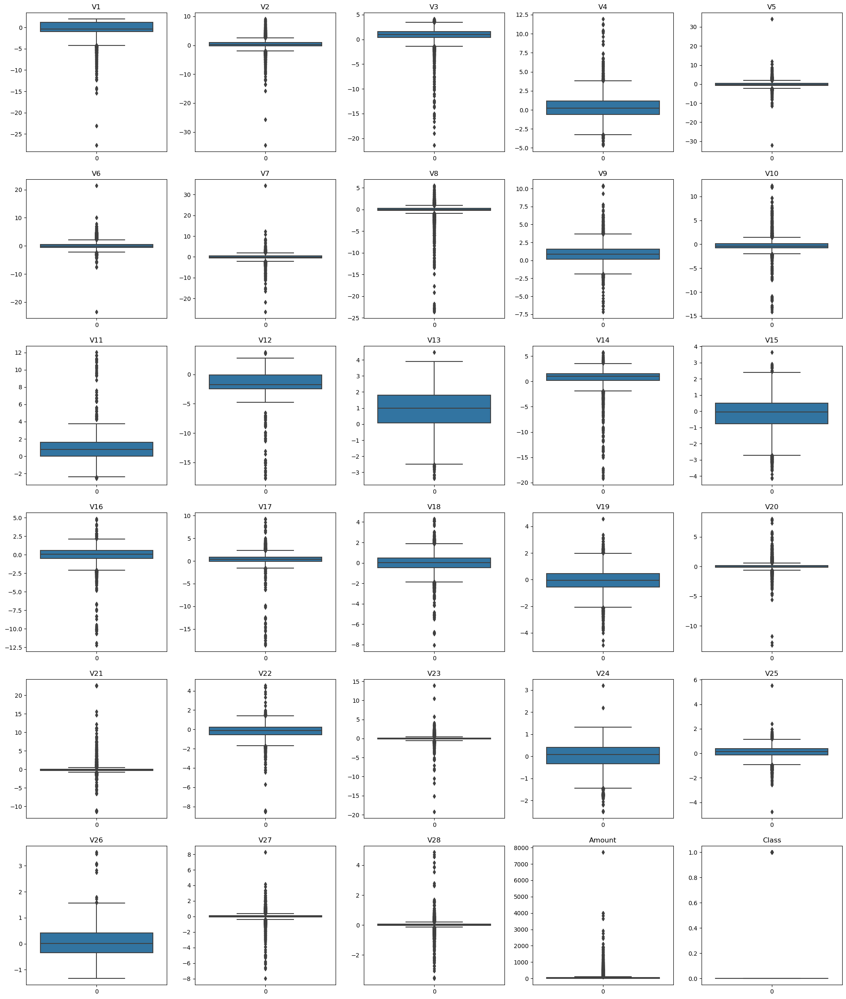

In [25]:
plt.subplots(6,5, figsize = (25,30))
i = 1
for col in col_lis:
    plt.subplot(6,5,i)
    sns.boxplot(df[col])
    plt.title(col)
    i += 1

<Axes: xlabel='Amount', ylabel='Count'>

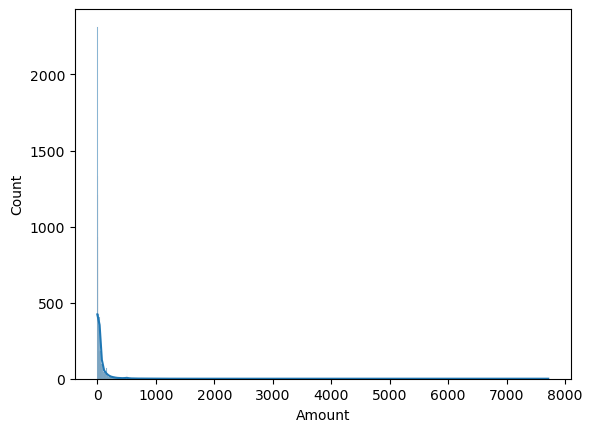

In [28]:
sns.histplot(df['Amount'], kde=True)

In [47]:
q1 = df.Amount.quantile(0.25)
q3 = df.Amount.quantile(0.75)
iqr = q3 - q1
low = q1 - 1.5*iqr
high = q3 + 1.5*iqr
print(q1, q3, iqr, low, high)
df = df[(df['Amount']>low) & (df['Amount']<high)]
df.shape

5.0 50.0 45.0 -62.5 117.5


(10194, 31)

<Axes: xlabel='Amount', ylabel='Count'>

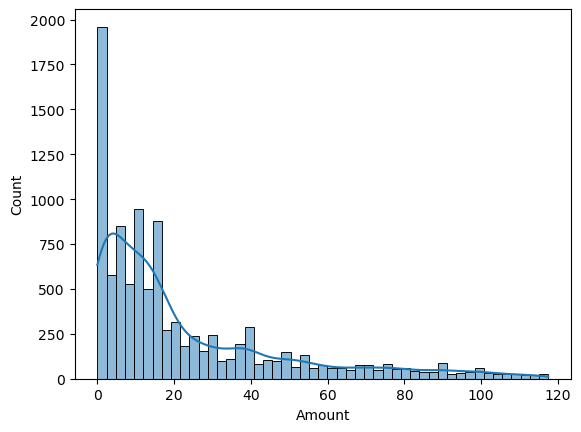

In [48]:
sns.histplot(df['Amount'], kde=True)

In [49]:
scaler = StandardScaler()
df['Amount'] = scaler.fit_transform(df[['Amount']])
df['Time'] = scaler.fit_transform(df[['Time']])

<Axes: xlabel='Time', ylabel='Count'>

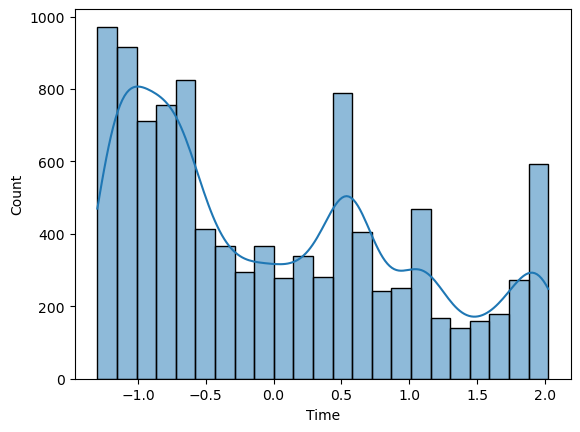

In [50]:
sns.histplot(df['Time'], kde=True)

In [51]:
sns.pairplot(df)

In [52]:
df.corr()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
Time,1.000000,0.071926,-0.045762,0.011976,0.077960,-0.103640,-0.022675,-0.167163,0.008585,0.427041,...,-0.029103,0.002171,0.016017,-0.028097,0.062665,0.099221,-0.051105,-0.009610,-0.027126,0.033953
V1,0.071926,1.000000,-0.371867,-0.039603,0.048054,-0.236728,0.084103,0.098263,0.190591,-0.072874,...,-0.158392,0.012333,-0.093636,-0.010970,0.273242,0.019963,-0.104802,0.121620,-0.008011,-0.102759
V2,-0.045762,-0.371867,1.000000,-0.286180,0.167591,-0.216598,0.045531,0.204453,-0.202028,-0.097392,...,0.206665,-0.172490,0.103972,-0.044216,-0.158862,-0.052172,0.058032,0.090996,-0.221410,0.220525
V3,0.011976,-0.039603,-0.286180,1.000000,-0.072055,-0.047660,-0.082427,0.384946,-0.052666,0.197304,...,-0.041118,0.238091,-0.102046,0.036658,-0.194682,0.035157,-0.155573,-0.076310,0.066831,-0.427772
V4,0.077960,0.048054,0.167591,-0.072055,1.000000,-0.085849,-0.050274,-0.194735,0.064998,-0.219450,...,-0.016553,0.001132,0.053501,-0.064775,-0.046292,0.048688,0.009960,0.020192,0.030752,0.261428
V5,-0.103640,-0.236728,-0.216598,-0.047660,-0.085849,1.000000,0.301358,0.123915,0.034696,-0.064699,...,-0.073479,-0.117300,-0.193650,0.035182,-0.064405,-0.117492,0.028907,-0.158646,-0.102478,-0.092519
V6,-0.022675,0.084103,0.045531,-0.082427,-0.050274,0.301358,1.000000,-0.134361,0.015549,0.007278,...,0.093374,-0.086724,0.057411,0.027151,0.110862,-0.042769,-0.102294,-0.013379,0.126020,-0.120721
V7,-0.167163,0.098263,0.204453,0.384946,-0.194735,0.123915,-0.134361,1.000000,0.158381,0.027977,...,-0.188057,0.089336,-0.064045,0.008344,-0.126442,-0.115115,-0.208975,-0.130038,-0.075260,-0.314032
V8,0.008585,0.190591,-0.202028,-0.052666,0.064998,0.034696,0.015549,0.158381,1.000000,-0.108402,...,-0.435882,0.214454,-0.191106,0.026958,-0.008220,0.020608,0.063688,0.118401,0.028761,0.064403
V9,0.427041,-0.072874,-0.097392,0.197304,-0.219450,-0.064699,0.007278,0.027977,-0.108402,1.000000,...,-0.013923,0.016429,0.011163,0.010382,0.147609,0.093815,-0.057429,-0.161797,-0.018561,-0.194017


<Axes: >

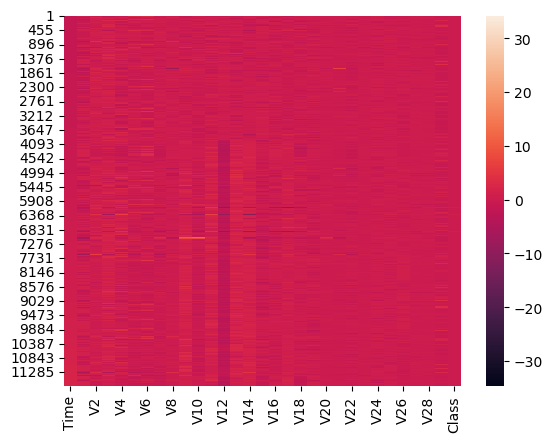

In [53]:
sns.heatmap(df)

<Axes: >

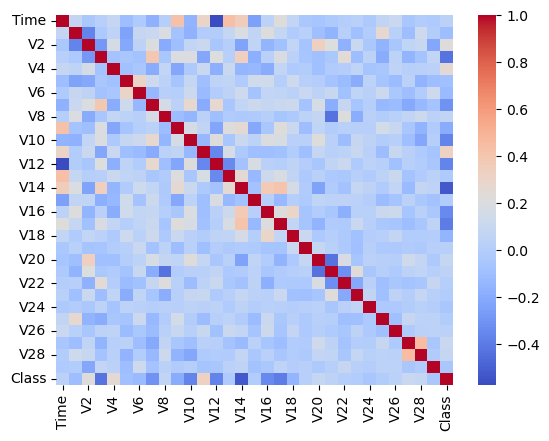

In [54]:
sns.heatmap(df.corr(), cmap='coolwarm')

In [56]:
x = df.drop(['Class'], axis=1)
y = df['Class']

In [57]:
x_train, x_test, y_train, y_test = train_test_split(x,y, train_size=0.8, random_state=42)

In [59]:
print(x_train.shape, y_train.shape)
print(x_test.shape, y_test.shape)

(8155, 30) (8155,)
(2039, 30) (2039,)


In [67]:
log_model = LogisticRegression()
log_model.fit(x_train, y_train)
log_pred = log_model.predict(x_test)
print('Accuracy: ',accuracy_score(y_test, log_pred))
print(classification_report(y_test, log_pred))
print('Confusion Matrix:','\n', confusion_matrix(y_test,log_pred))

Accuracy:  0.9990191270230505
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2030
         1.0       0.89      0.89      0.89         9

    accuracy                           1.00      2039
   macro avg       0.94      0.94      0.94      2039
weighted avg       1.00      1.00      1.00      2039

Confusion Matrix: 
 [[2029    1]
 [   1    8]]


In [65]:
y_test.value_counts()

0.0    2030
1.0       9
Name: Class, dtype: int64

In [66]:
skf = StratifiedKFold(n_splits=10)
cross_val_score(log_model, x,y,cv=skf)

C:\Users\Nandhakumar\anaconda3\Anaconda2023\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Nandhakumar\anaconda3\Anaconda2023\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_mo

array([0.99803922, 0.99901961, 0.99901961, 1.        , 1.        ,
       1.        , 1.        , 1.        , 0.99509323, 0.99607458])

In [69]:
log_model.predict(x.iloc[[8888]])

array([0.])

In [70]:
y.iloc[8888]

0.0

In [76]:
for estimator in [RandomForestClassifier, DecisionTreeClassifier]:
    model = estimator()
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    print(f'The evaluated scores and report of {model} estimator')
    print('\n')
    print('Accuracy Score: ', accuracy_score(y_test, y_pred))
    print('\n')
    print(classification_report(y_test,y_pred))
    print('\n')
    print('Confusion Matrix:','\n', confusion_matrix(y_test, y_pred))
    print('\n')

The evaluated scores and report of RandomForestClassifier() estimator


Accuracy Score:  0.9985286905345758


              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2030
         1.0       0.88      0.78      0.82         9

    accuracy                           1.00      2039
   macro avg       0.94      0.89      0.91      2039
weighted avg       1.00      1.00      1.00      2039



Confusion Matrix: 
 [[2029    1]
 [   2    7]]


The evaluated scores and report of DecisionTreeClassifier() estimator


Accuracy Score:  0.9985286905345758


              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      2030
         1.0       0.88      0.78      0.82         9

    accuracy                           1.00      2039
   macro avg       0.94      0.89      0.91      2039
weighted avg       1.00      1.00      1.00      2039



Confusion Matrix: 
 [[2029    1]
 [   2    7]]


